In [1]:
import pandas as pd
import numpy as np

In [2]:
from gensim.models import Word2Vec

In [3]:
from get_book_img import get_book_img

In [41]:
from matplotlib import pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

In [5]:
from sklearn.manifold import TSNE

In [6]:
books = pd.read_csv('goodbooks-10k-master/books.csv')

In [8]:
mf50_vectors = np.load('models/mf_book_vectors.npy')
mf100_vectors = np.load('models/mf_book_vectors_100.npy')
nmf_embeds =  np.load('models/tags_nmf.npy')
w2v_model = Word2Vec.load('models/gensim_sg_w2v')

In [9]:
book_dict = {}
for i,row in books.iterrows():
    book_dict[row['book_id']] = {"title": row["title"]
                                 ,"goodreads_id":row["goodreads_book_id"]
                                 ,"image_url": row["image_url"]
                                 ,"authors":row["authors"]
                                 ,"mf50": mf50_vectors[row['book_id']]
                                 ,"mf100": mf100_vectors[row['book_id']]
                                 ,'nmf':nmf_embeds[row['book_id']-1]
                                 ,"w2v":w2v_model.wv[row["title"]]
                                }

In [55]:
top_n = 300
embed_type = 'w2v'
embed_length = len(book_dict[1][embed_type])

top_embeds = np.zeros((top_n,embed_length))
images = []
for i in range(1,top_n):
        top_embeds[i-1,] = book_dict[i][embed_type]
        images.append(get_book_img(book_dict[i]["goodreads_id"],book_dict[i]["image_url"]))

In [35]:
tsne = TSNE(n_components=2, init='pca', random_state=0)
X_tsne = tsne.fit_transform(top_embeds)

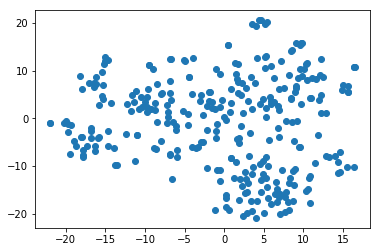

In [36]:
plt.plot(X_tsne[:,0],X_tsne[:,1],'o')

In [66]:
# sourced from https://www.kaggle.com/gaborvecsei/plants-t-sne
def visualize_scatter_with_images(X_2d_data, images, figsize=(45,45), image_zoom=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    return plt

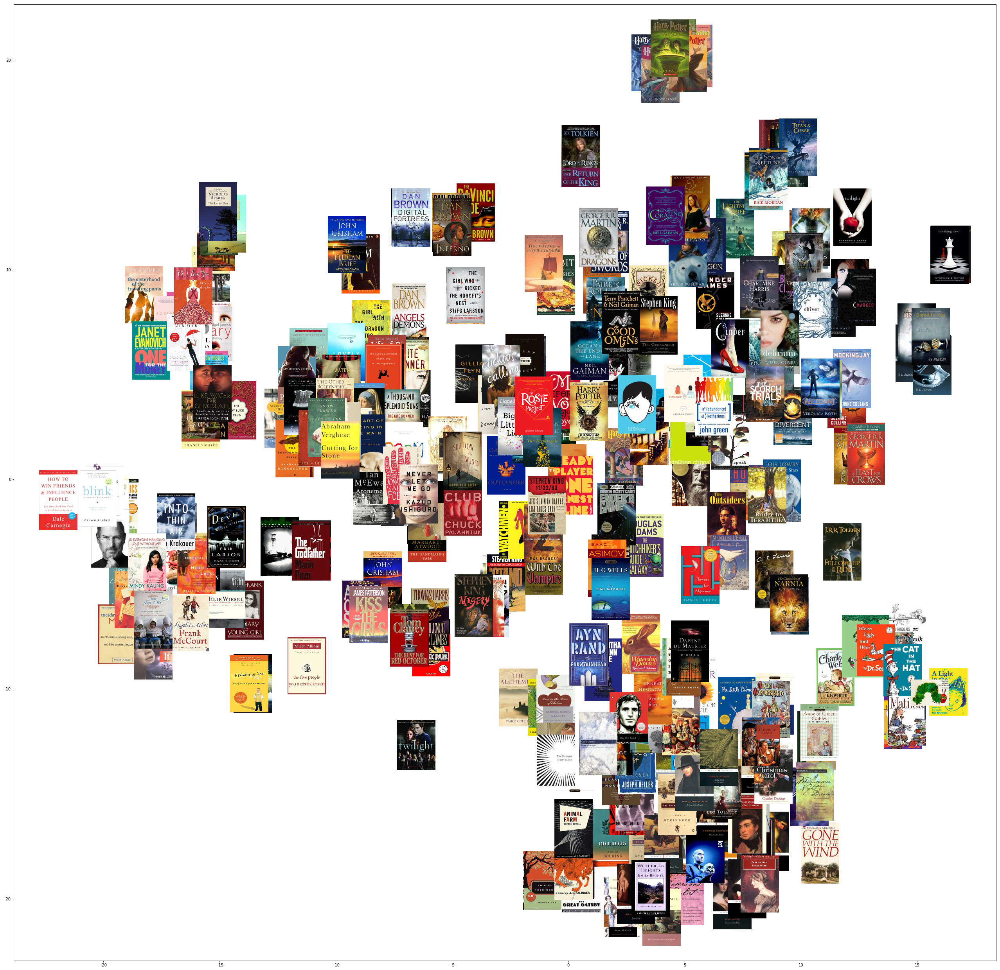

In [69]:
w2v_tnse = visualize_scatter_with_images(X_tsne,images)
w2v_tnse.savefig("top200_tsne_projection.png")
w2v_tnse.show()

In [59]:
embed_type = 'mf50'
embed_length = len(book_dict[1][embed_type])
mf50_embeds = np.zeros((top_n,embed_length))
for i in range(1,top_n):
    mf50_embeds[i-1,] = book_dict[i][embed_type]

In [60]:
X_mf50_tsne = tsne.fit_transform(mf50_embeds)

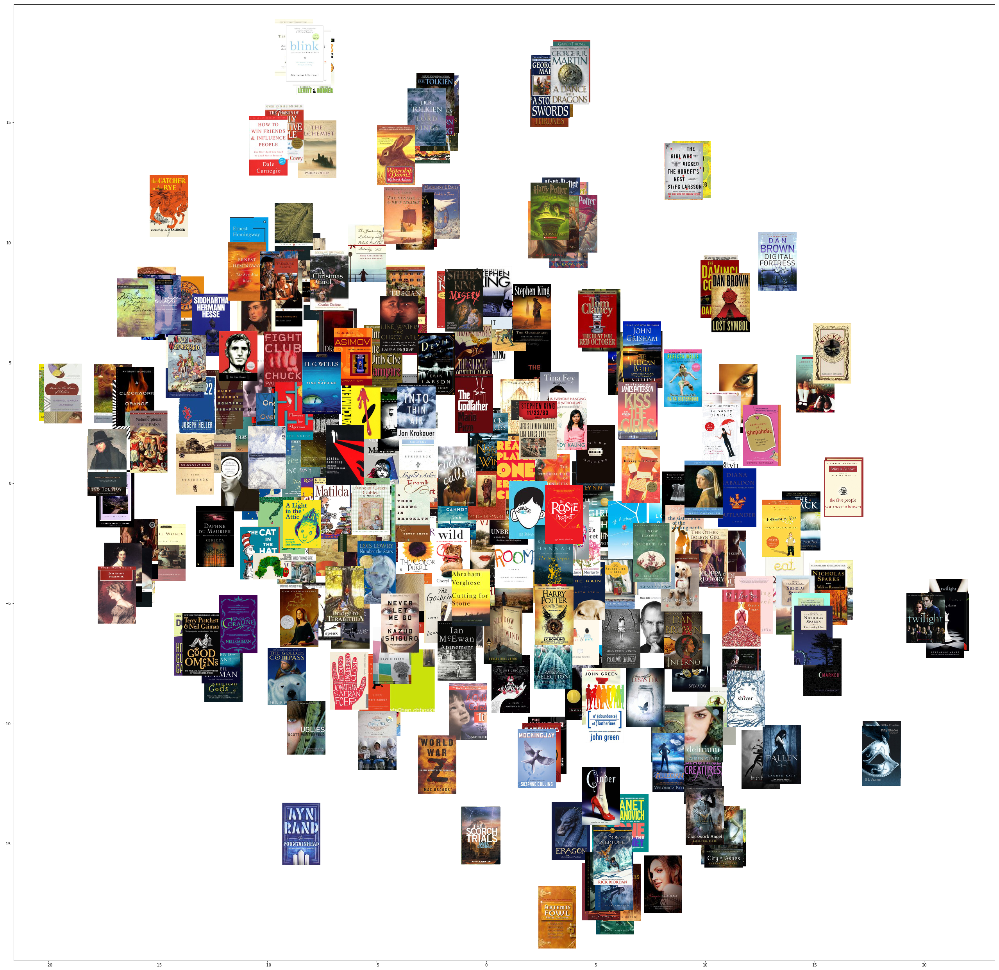

In [68]:
mf50_tnse = visualize_scatter_with_images(X_mf50_tsne,images)
mf50_tnse.show()

In [62]:
embed_type = 'nmf'
embed_length = len(book_dict[1][embed_type])
nmf_embeds = np.zeros((top_n,embed_length))
for i in range(1,top_n):
    nmf_embeds[i-1,] = book_dict[i][embed_type]


In [63]:
X_nmf_tsne = tsne.fit_transform(nmf_embeds)

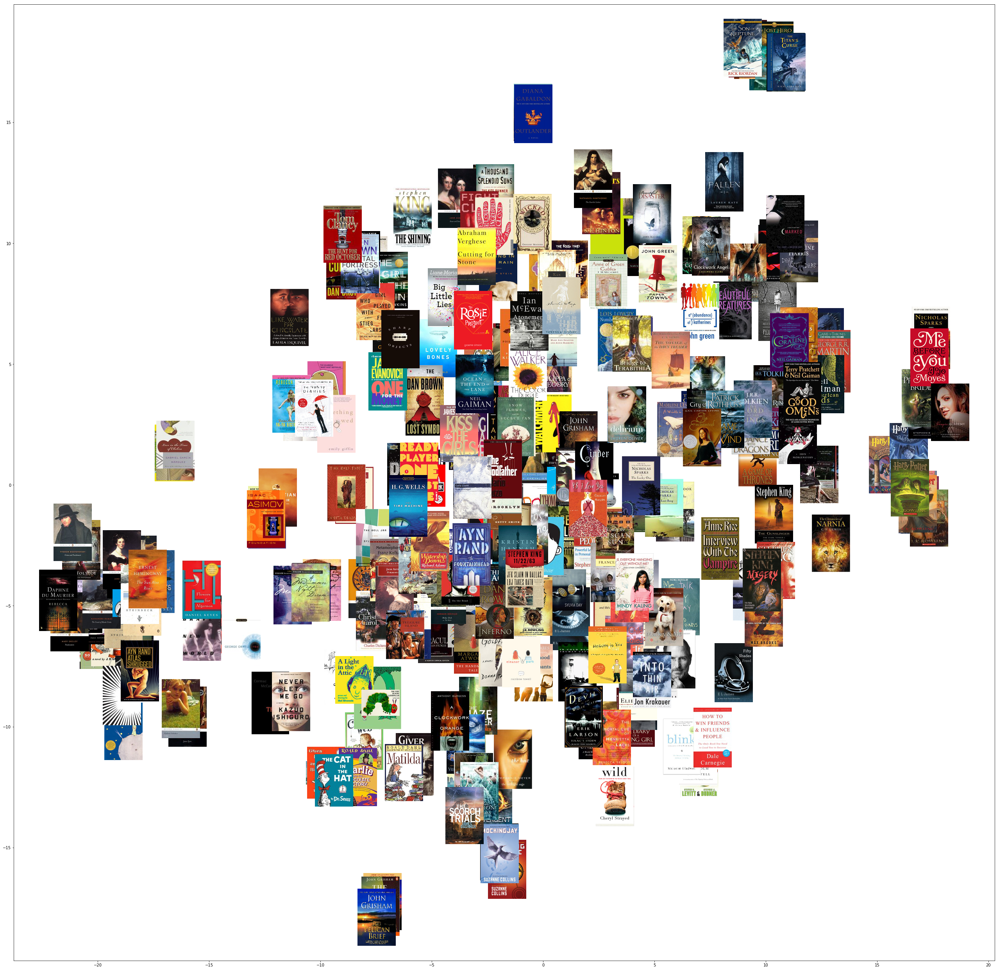

In [64]:
nmf_tnse = visualize_scatter_with_images(X_nmf_tsne,images)
nmf_tnse.show()